# Task 3



Training a convolutional neural network on the following dataset:
https://www.kaggle.com/paultimothymooney/breast-histopathology-images</br>
1. Model without residual connections (using batch normalization) </br>
2. Augmenting the data using rotations, mirroring and possibly other transformations. </br>
3. Building a deeper model using residual connections. You can build a deep model
that would not be able to learn if you remove the residual connections. </br>


In [0]:
import os
import fnmatch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import keras

from glob import glob
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Input, add
from keras.layers import Conv2D, MaxPooling2D, Flatten
from keras.layers.normalization import BatchNormalization
from keras.utils import to_categorical
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import History 
from sklearn.model_selection import train_test_split



The zipped data was saved to Google Drive, and then unzipped from Colab.


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!mkdir "drive/My Drive/train"  #create a directory named train/


mkdir: cannot create directory ‘drive/My Drive/train’: File exists


In [0]:
# !ls "/content/drive/My Drive"
!unzip "/content/drive/My Drive/breast-histopathology-images.zip" -d train/

Archive:  /content/drive/My Drive/breast-histopathology-images.zip
  inflating: train/IDC_regular_ps50_idx5.zip  


In [0]:
!unzip "/content/train/IDC_regular_ps50_idx5.zip" -d "/content/drive/My Drive/train/"

Archive:  /content/train/IDC_regular_ps50_idx5.zip
replace /content/drive/My Drive/train/10253/0/10253_idx5_x1001_y1001_class0.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace /content/drive/My Drive/train/10253/0/10253_idx5_x1001_y1051_class0.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace /content/drive/My Drive/train/10253/0/10253_idx5_x1001_y1101_class0.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
 extracting: /content/drive/My Drive/train/12896/0/12896_idx5_x2201_y1851_class0.png  
 extracting: /content/drive/My Drive/train/12896/0/12896_idx5_x2201_y1951_class0.png  
 extracting: /content/drive/My Drive/train/12896/0/12896_idx5_x2201_y2001_class0.png  
 extracting: /content/drive/My Drive/train/12896/0/12896_idx5_x2251_y1851_class0.png  
 extracting: /content/drive/My Drive/train/12896/0/12896_idx5_x2251_y1951_class0.png  
 extracting: /content/drive/My Drive/train/12896/0/12896_idx5_x2251_y2001_class0.png  
 extracting: /content/drive/My Drive/train/12896/0/12896_idx5_x2

Ensuring that the folder structure was intact after the zip:

In [0]:
folderNames = os.listdir("/content/drive/My Drive/train")
for filename in folderNames[0:10]:
    print(filename)

13023
13024
13025
13400
13401
13402
13404
13458
13459
13460


There are 279 folders of ID's.

In [0]:
len(folderNames)

279

We then access the PNG image names from the folders.

In [0]:
imagePatches = glob('/content/drive/My Drive/train/**/*.png', recursive=True)
for filename in imagePatches[0:10]:
    print(filename)

/content/drive/My Drive/train/13023/0/13023_idx5_x151_y751_class0.png
/content/drive/My Drive/train/13023/0/13023_idx5_x351_y801_class0.png
/content/drive/My Drive/train/13023/0/13023_idx5_x351_y1051_class0.png
/content/drive/My Drive/train/13023/0/13023_idx5_x151_y1001_class0.png
/content/drive/My Drive/train/13023/0/13023_idx5_x251_y1001_class0.png
/content/drive/My Drive/train/13023/0/13023_idx5_x201_y1001_class0.png
/content/drive/My Drive/train/13023/0/13023_idx5_x351_y1001_class0.png
/content/drive/My Drive/train/13023/0/13023_idx5_x101_y1001_class0.png
/content/drive/My Drive/train/13023/0/13023_idx5_x351_y951_class0.png
/content/drive/My Drive/train/13023/0/13023_idx5_x351_y901_class0.png


We segregate classOne (IDC positive) and classZero (IDC negative) images. 

In [0]:
patternZero = '*class0.png'
patternOne = '*class1.png'
classZero = fnmatch.filter(imagePatches, patternZero)
classOne = fnmatch.filter(imagePatches, patternOne)
# print("IDC(-)\n\n",classZero[0:5],'\n')
# print("IDC(+)\n\n",classOne[0:5])

We subsample 20,000 images from the batch to use in our models.

In [0]:
# sampling 20000 images
X = list(map(cv2.imread, imagePatches[0:20000]))
Y = list([0 if img in classZero else 1 for img in imagePatches[0:20000]])

We look at image sizes from the sample. As can be seen, most images are 50 x 50. There are some images that aren't, and we can see them by zooming in the histogram.

(0, 30)

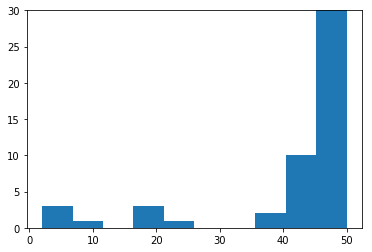

In [0]:
# plot histogram of sizes
list_array = []
for i in range(0, len(X)):
  list_array.append(X[i].shape[1])
  
plt.hist(list_array)
plt.ylim(0,30)

We then resize all the images to 50 x 50.

In [0]:
X_resized = list([cv2.resize(img, (50, 50)) for img in X])

We observe the color intensity of the images, and subsequently rescale the images.

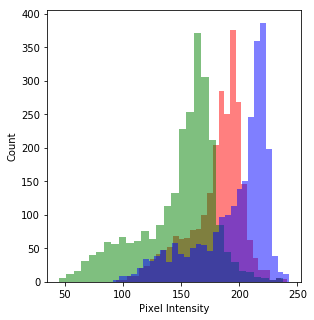

In [0]:
# datavis of data: image characteristics e.g. intensity, class 0/1 dist

plt.figure(figsize=(10,5))
plt.axis('off')
histo = plt.subplot(1,2,2)
histo.set_ylabel('Count')
histo.set_xlabel('Pixel Intensity')
n_bins = 30
plt.hist(X_resized[999][:,:,0].flatten(), bins= n_bins, lw = 0, color='r', 
         alpha=0.5);
plt.hist(X_resized[999][:,:,1].flatten(), bins= n_bins, lw = 0, color='g', 
         alpha=0.5);
plt.hist(X_resized[999][:,:,2].flatten(), bins= n_bins, lw = 0, color='b', 
         alpha=0.5);

In [0]:
X_resized = np.array(X_resized)
Y = np.array(Y)

X_resized = X_resized/255.0

We then confirm that the images have been scaled.

(array([    0.,     0.,     0.,     0.,     0., 20000.,     0.,     0.,
            0.,     0.]),
 array([49.5, 49.6, 49.7, 49.8, 49.9, 50. , 50.1, 50.2, 50.3, 50.4, 50.5]),
 <a list of 10 Patch objects>)

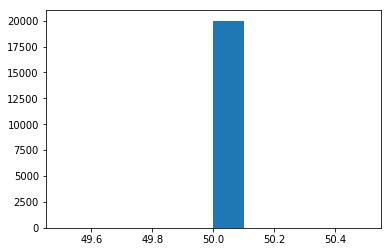

In [0]:
list_array = []
for i in range(0, len(X_resized)):
  list_array.append(X_resized[i].shape[1])
  
plt.hist(list_array)

Next, we observe the class imbalances of our data. As can be seen, there are more IDC negative samples than positive ones. Therefore, it is essential that we use a metric suited to imbalanced datasets such as accuracy. 

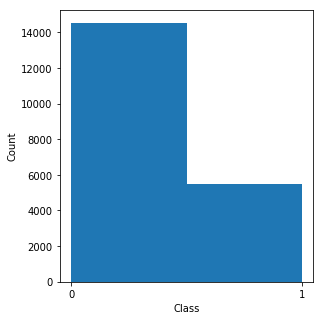

In [0]:
plt.figure(figsize=(10,5))
histo = plt.subplot(1,2,2)
histo.set_ylabel('Count')
histo.set_xlabel('Class')
# plt.hist(Y.flatten())
plt.hist(Y, bins = 2)
histo.set_xticks([0,1])


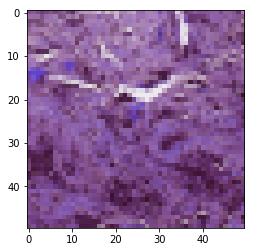

In [0]:
# checking that the manipulations so far have not garbled the image
plt.imshow(X_resized[180])

In [0]:
# Y = to_categorical(np.array(Y))

X_train, X_test, Y_train, Y_test = train_test_split(X_resized, Y)

# print("Training Data Shape:", X_train.shape)
# print("Testing Data Shape:", X_test.shape)

In [0]:
np.array(Y_train).shape

(15000,)

In [0]:
train_datagen = ImageDataGenerator()

# train_generator = train_datagen.flow_from_directory(
train_generator = train_datagen.flow(
    X_train, Y_train,
    batch_size=128, #tried 32
    shuffle=False, #tried true as well
    seed=42,
)

train_generator_test = train_datagen.flow(
    X_test, Y_test,
    batch_size=128, #tried 32
    shuffle=False, #tried true as well
    seed=42,
)

STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size

Our base model performs very well on our training set, but does not do as well on the test. The simple model is overfitting to our training set in this case. 

In [0]:
# task 3.1: base model

cnn_base = Sequential()
hist_base = History()

adam = keras.optimizers.Adam(lr=0.001) #default is 0.001
# tried this as well: keras.optimizers.Adadelta(), similar score

cnn_base.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(50, 50, 3)))
cnn_base.add(MaxPooling2D(pool_size=(2, 2)))
cnn_base.add(Flatten())
cnn_base.add(Dense(2, activation='softmax'))
cnn_base.compile(optimizer = adam, loss = "sparse_categorical_crossentropy", 
                 metrics = ['accuracy'])


cnn_base.fit_generator(generator=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    epochs=100,
                    validation_steps = STEP_SIZE_TRAIN_AUG,
                    validation_data=train_generator_test,
                    callbacks=[hist_base]
)

Epoch 1/100
117/117 [==============================] - 4s 37ms/step - loss: 0.5815 - acc: 0.7334 - val_loss: 0.4852 - val_acc: 0.7364
Epoch 2/100
117/117 [==============================] - 2s 13ms/step - loss: 0.4071 - acc: 0.8310 - val_loss: 0.4033 - val_acc: 0.8214
Epoch 3/100
117/117 [==============================] - 2s 13ms/step - loss: 0.3745 - acc: 0.8460 - val_loss: 0.4008 - val_acc: 0.8253
Epoch 4/100
117/117 [==============================] - 2s 13ms/step - loss: 0.3578 - acc: 0.8525 - val_loss: 0.3572 - val_acc: 0.8524
Epoch 5/100
117/117 [==============================] - 2s 13ms/step - loss: 0.3468 - acc: 0.8563 - val_loss: 0.3526 - val_acc: 0.8556
Epoch 6/100
117/117 [==============================] - 2s 13ms/step - loss: 0.3386 - acc: 0.8592 - val_loss: 0.3572 - val_acc: 0.8508
Epoch 7/100
117/117 [==============================] - 2s 13ms/step - loss: 0.3303 - acc: 0.8622 - val_loss: 0.3656 - val_acc: 0.8499
Epoch 8/100
117/117 [==============================] - 2s 13ms

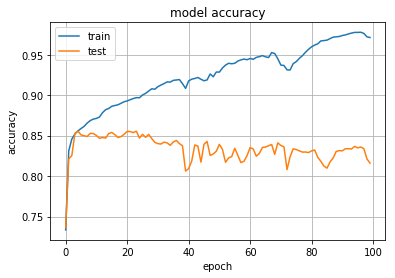

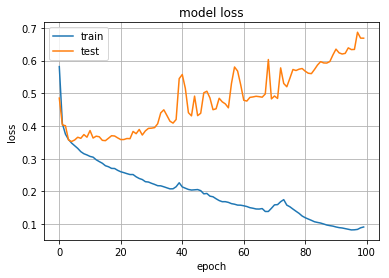

In [0]:

plt.plot(hist_base.history['acc'])
plt.plot(hist_base.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

plt.plot(hist_base.history['loss'])
plt.plot(hist_base.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

When we add dropout to the model (and add more layers), the accuracy decreases. 

In [0]:
# dropout model
cnn_drop = Sequential()
hist_drop = History()

cnn_drop.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(50, 50, 3)))
cnn_drop.add(MaxPooling2D(pool_size=(2, 2)))
cnn_drop.add(Conv2D(32, (3, 3), activation='relu'))
cnn_drop.add(MaxPooling2D(pool_size=(2, 2)))
cnn_drop.add(Dropout(0.25))

cnn_drop.add(Dense(64, activation='relu'))
cnn_drop.add(Dropout(0.5))
cnn_drop.add(Dense(64, activation='relu'))
cnn_drop.add(Dropout(0.5))
cnn_drop.add(Dense(64, activation='relu'))
cnn_drop.add(Dropout(0.5))
cnn_drop.add(Dense(64, activation='relu'))
cnn_drop.add(Dropout(0.5))
  
cnn_drop.add(Flatten())
cnn_drop.add(Dense(64, activation='relu'))
cnn_drop.add(Dropout(0.5))


cnn_drop.add(Dense(2, activation='softmax'))
#default adam seems to be better in this case (LR =0.001)
cnn_drop.compile(optimizer = "adam", loss = "sparse_categorical_crossentropy", 
                 metrics = ['accuracy'])


cnn_drop.fit_generator(generator=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    epochs=100,
                    validation_steps = STEP_SIZE_TRAIN_AUG,
                    validation_data=train_generator_test,
                    callbacks=[hist_drop]
)

Epoch 1/100
117/117 [==============================] - 6s 51ms/step - loss: 0.4837 - acc: 0.7784 - val_loss: 0.5280 - val_acc: 0.8314
Epoch 2/100
117/117 [==============================] - 2s 21ms/step - loss: 0.3927 - acc: 0.8484 - val_loss: 0.4786 - val_acc: 0.8053
Epoch 3/100
117/117 [==============================] - 3s 21ms/step - loss: 0.3719 - acc: 0.8520 - val_loss: 0.5337 - val_acc: 0.7598
Epoch 4/100
117/117 [==============================] - 2s 21ms/step - loss: 0.3625 - acc: 0.8525 - val_loss: 0.5632 - val_acc: 0.7492
Epoch 5/100
117/117 [==============================] - 2s 21ms/step - loss: 0.3522 - acc: 0.8569 - val_loss: 0.4711 - val_acc: 0.8119
Epoch 6/100
117/117 [==============================] - 2s 21ms/step - loss: 0.3459 - acc: 0.8597 - val_loss: 0.4222 - val_acc: 0.8367
Epoch 7/100
117/117 [==============================] - 2s 21ms/step - loss: 0.3541 - acc: 0.8566 - val_loss: 0.4838 - val_acc: 0.8109
Epoch 8/100
117/117 [==============================] - 2s 21ms

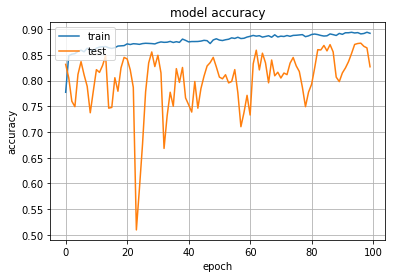

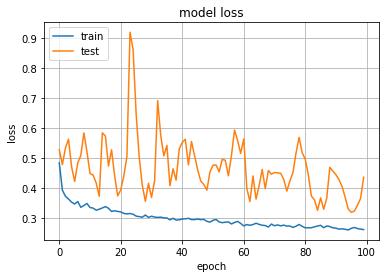

In [0]:
plt.plot(hist_drop.history['acc'])
plt.plot(hist_drop.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

plt.plot(hist_drop.history['loss'])
plt.plot(hist_drop.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

Next, we try batch normalization. Performance drops; it does worse than our base model as well as the dropout model. The learning rate was changed here, because the model got stuck at some point when it made a large jump.

In [0]:
#batch model
cnn_batch = Sequential()
hist_batch = History()

adam2 = keras.optimizers.Adam(lr=0.00001) #default is 0.001

cnn_batch.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(50, 50, 3)))

cnn_batch.add(BatchNormalization())

cnn_batch.add(MaxPooling2D(pool_size=(2, 2)))
cnn_batch.add(Flatten())
cnn_batch.add(Dense(2, activation='softmax'))

cnn_batch.add(BatchNormalization())

cnn_batch.compile(optimizer = adam2, loss = "sparse_categorical_crossentropy", 
                  metrics = ['accuracy'])


cnn_batch.fit_generator(generator=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    epochs=100,
                    validation_steps = STEP_SIZE_TRAIN_AUG,
                    validation_data=train_generator_test,
                    callbacks=[hist_batch]
)

Epoch 1/100
117/117 [==============================] - 6s 48ms/step - loss: 6.2054 - acc: 0.5995 - val_loss: 5.2998 - val_acc: 0.6574
Epoch 2/100
117/117 [==============================] - 2s 18ms/step - loss: 5.2046 - acc: 0.6643 - val_loss: 4.7474 - val_acc: 0.6929
Epoch 3/100
117/117 [==============================] - 2s 18ms/step - loss: 4.8107 - acc: 0.6886 - val_loss: 4.4235 - val_acc: 0.7126
Epoch 4/100
117/117 [==============================] - 2s 18ms/step - loss: 4.3916 - acc: 0.7141 - val_loss: 3.8750 - val_acc: 0.7467
Epoch 5/100
117/117 [==============================] - 2s 18ms/step - loss: 3.8990 - acc: 0.7453 - val_loss: 3.6095 - val_acc: 0.7633
Epoch 6/100
117/117 [==============================] - 2s 18ms/step - loss: 3.5805 - acc: 0.7662 - val_loss: 3.3759 - val_acc: 0.7771
Epoch 7/100
117/117 [==============================] - 2s 18ms/step - loss: 3.5005 - acc: 0.7703 - val_loss: 3.2542 - val_acc: 0.7863
Epoch 8/100
117/117 [==============================] - 2s 18ms

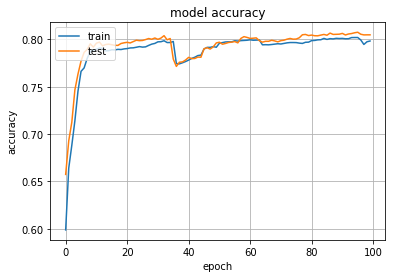

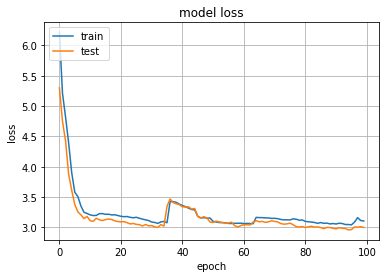

In [0]:
plt.plot(hist_batch.history['acc'])
plt.plot(hist_batch.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

plt.plot(hist_batch.history['loss'])
plt.plot(hist_batch.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

We then combine batch normalization and dropout (with more layers). This model does the worst of all. 

In [0]:
# batch and dropout model
cnn_combo = Sequential()
hist_combo = History()

cnn_combo.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(50, 50, 3)))

cnn_combo.add(BatchNormalization())

cnn_combo.add(MaxPooling2D(pool_size=(2, 2)))
cnn_combo.add(Conv2D(32, (3, 3), activation='relu'))

cnn_combo.add(BatchNormalization())

cnn_combo.add(MaxPooling2D(pool_size=(2, 2)))
cnn_combo.add(Dropout(0.25))

cnn_combo.add(Flatten())
cnn_combo.add(Dense(64, activation='relu'))
cnn_combo.add(BatchNormalization())

cnn_combo.add(Dense(64, activation='relu'))
cnn_combo.add(Dropout(0.5))
cnn_combo.add(BatchNormalization())

cnn_combo.add(Dense(64, activation='relu'))
cnn_combo.add(Dropout(0.5))
cnn_combo.add(BatchNormalization())

cnn_combo.add(Dense(64, activation='relu'))
cnn_combo.add(Dropout(0.5))
cnn_combo.add(BatchNormalization())

cnn_combo.add(Dense(64, activation='relu'))
cnn_combo.add(Dropout(0.5))
cnn_combo.add(BatchNormalization())

cnn_combo.add(Dense(2, activation='softmax'))

cnn_combo.add(BatchNormalization())

cnn_combo.compile(optimizer = "adam", loss = "sparse_categorical_crossentropy", 
                  metrics = ['accuracy'])


cnn_combo.fit_generator(generator=train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    epochs=100,
                    validation_steps = STEP_SIZE_TRAIN_AUG,
                    validation_data=train_generator_test,
                    callbacks=[hist_combo]
)

Epoch 1/100
117/117 [==============================] - 8s 73ms/step - loss: 7.2522 - acc: 0.5244 - val_loss: 4.3808 - val_acc: 0.6229
Epoch 2/100
117/117 [==============================] - 3s 30ms/step - loss: 6.8453 - acc: 0.5314 - val_loss: 5.8400 - val_acc: 0.4674
Epoch 3/100
117/117 [==============================] - 3s 29ms/step - loss: 5.8172 - acc: 0.5741 - val_loss: 5.0725 - val_acc: 0.5486
Epoch 4/100
117/117 [==============================] - 4s 32ms/step - loss: 4.9598 - acc: 0.6083 - val_loss: 3.5612 - val_acc: 0.6635
Epoch 5/100
117/117 [==============================] - 4s 31ms/step - loss: 4.1636 - acc: 0.6361 - val_loss: 3.3471 - val_acc: 0.7283
Epoch 6/100
117/117 [==============================] - 3s 29ms/step - loss: 3.0062 - acc: 0.6688 - val_loss: 0.7624 - val_acc: 0.7264
Epoch 7/100
117/117 [==============================] - 3s 30ms/step - loss: 2.0349 - acc: 0.6804 - val_loss: 0.7265 - val_acc: 0.6890
Epoch 8/100
117/117 [==============================] - 4s 30ms

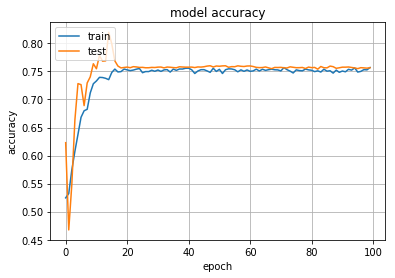

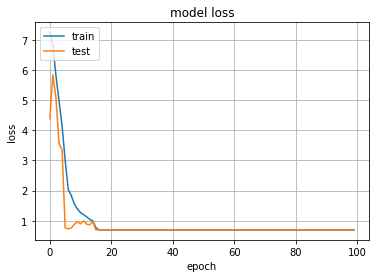

In [0]:
plt.plot(hist_combo.history['acc'])
plt.plot(hist_combo.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

plt.plot(hist_combo.history['loss'])
plt.plot(hist_combo.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

We try to augment our data through rotations, flips and height/ width shifts. This improves our combination batch normalization/ dropout model. This model does not learn (as can be seen through the accuracy/ loss plots). 

In [0]:
#task 3.2: data augmentation
augment_datagen = ImageDataGenerator(rotation_range=180,
                                    horizontal_flip=True,
                                    vertical_flip=True,
                                    height_shift_range=0.5,
                                    width_shift_range=0.5,
                                    )

augment_generator = augment_datagen.flow(
    X_train, Y_train,
    batch_size=128,
    shuffle=False,
    seed=42
)

augment_generator_test = augment_datagen.flow(
    X_test, Y_test,
    batch_size=128,
    shuffle=False,
    seed=42
)

STEP_SIZE_TRAIN_AUG=augment_generator.n//train_generator.batch_size

cnn_combo.fit_generator(generator=augment_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN_AUG,
                    epochs=100,
                    validation_steps = STEP_SIZE_TRAIN_AUG,
                    validation_data=augment_generator_test,
                    callbacks=[hist_combo]    
                 )
                 

Epoch 1/100
117/117 [==============================] - 22s 187ms/step - loss: 0.6931 - acc: 0.7411 - val_loss: 0.6931 - val_acc: 0.7292
Epoch 2/100
117/117 [==============================] - 20s 170ms/step - loss: 0.6931 - acc: 0.7363 - val_loss: 0.6931 - val_acc: 0.7305
Epoch 3/100
117/117 [==============================] - 22s 190ms/step - loss: 0.6931 - acc: 0.7339 - val_loss: 0.6931 - val_acc: 0.7298
Epoch 4/100
117/117 [==============================] - 20s 170ms/step - loss: 0.6931 - acc: 0.7352 - val_loss: 0.6931 - val_acc: 0.7314
Epoch 5/100
117/117 [==============================] - 21s 181ms/step - loss: 0.6931 - acc: 0.7364 - val_loss: 0.6931 - val_acc: 0.7313
Epoch 6/100
117/117 [==============================] - 20s 168ms/step - loss: 0.6931 - acc: 0.7368 - val_loss: 0.6931 - val_acc: 0.7313
Epoch 7/100
117/117 [==============================] - 20s 169ms/step - loss: 0.6931 - acc: 0.7322 - val_loss: 0.6931 - val_acc: 0.7304
Epoch 8/100
117/117 [===========================

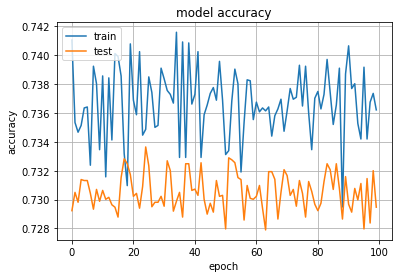

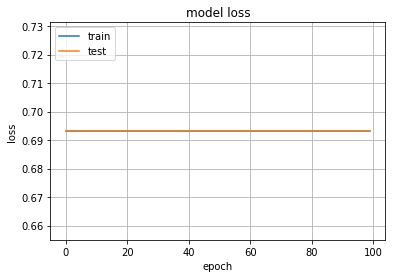

In [0]:
plt.plot(hist_combo.history['acc'])
plt.plot(hist_combo.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

plt.plot(hist_combo.history['loss'])
plt.plot(hist_combo.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

We try data augmentation with our best-performing batch normalization model (the base model performs the best on our training set overall, but the batch does well on both training and test). In this case, the accuracy increases slightly with augmentation.

In [0]:
cnn_batch.fit_generator(generator=augment_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN_AUG,
                    epochs=100,
                    validation_steps = STEP_SIZE_TRAIN_AUG,
                    validation_data=augment_generator_test,
                    callbacks=[hist_batch]
                 )

Epoch 1/100
117/117 [==============================] - 21s 178ms/step - loss: 3.1049 - acc: 0.7968 - val_loss: 3.0184 - val_acc: 0.8022
Epoch 2/100
117/117 [==============================] - 19s 160ms/step - loss: 3.1403 - acc: 0.7938 - val_loss: 3.0469 - val_acc: 0.8006
Epoch 3/100
117/117 [==============================] - 19s 162ms/step - loss: 3.0761 - acc: 0.7977 - val_loss: 3.1075 - val_acc: 0.7958
Epoch 4/100
117/117 [==============================] - 19s 161ms/step - loss: 3.0911 - acc: 0.7975 - val_loss: 3.0295 - val_acc: 0.8014
Epoch 5/100
117/117 [==============================] - 20s 173ms/step - loss: 3.1230 - acc: 0.7953 - val_loss: 2.9359 - val_acc: 0.8073
Epoch 6/100
117/117 [==============================] - 19s 161ms/step - loss: 3.0674 - acc: 0.7987 - val_loss: 2.9911 - val_acc: 0.8042
Epoch 7/100
117/117 [==============================] - 19s 160ms/step - loss: 3.0580 - acc: 0.7996 - val_loss: 2.9318 - val_acc: 0.8073
Epoch 8/100
117/117 [===========================

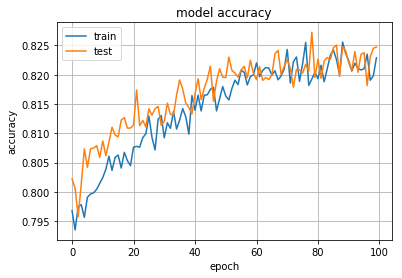

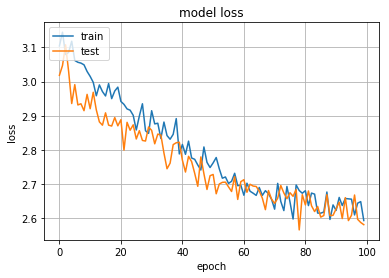

In [0]:
plt.plot(hist_batch.history['acc'])
plt.plot(hist_batch.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

plt.plot(hist_batch.history['loss'])
plt.plot(hist_batch.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

We create a deep model and test it without residual connections, and then compare it to the same model with residual connections. As can be seen, the model with residual connections performs better.

In [0]:
#task 3.3 resnet
conv1_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(inputs)
conv1_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv1_1)
maxpool1 = MaxPooling2D(pool_size=(2, 2))(conv1_2)

conv2_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(maxpool1)
conv2_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv2_1)
maxpool2 = MaxPooling2D(pool_size=(2, 2))(conv2_2)

conv3_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(maxpool2)
conv3_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv3_1)
maxpool3 = MaxPooling2D(pool_size=(2, 2))(conv3_2)

conv4_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(maxpool3)
conv4_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv4_1)
maxpool4 = MaxPooling2D(pool_size=(2, 2))(conv4_2)

conv5_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(maxpool4)
conv5_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv5_1)
maxpool5 = MaxPooling2D(pool_size=(2, 2))(conv5_2)


flat = Flatten()(maxpool5)
dense = Dense(64, activation='relu')(flat)
predictions = Dense(2, activation='softmax')(dense)
model = Model(inputs=inputs, outputs=predictions)

model.compile(optimizer = "adam", loss = "sparse_categorical_crossentropy", 
              metrics = ['accuracy'])


model.fit_generator(generator=augment_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN_AUG,
                    epochs=100,
                    validation_steps = STEP_SIZE_TRAIN_AUG,
                    validation_data=augment_generator_test,
                    callbacks=[history]
)

Epoch 1/100
117/117 [==============================] - 9s 78ms/step - loss: 0.5783 - acc: 0.7285 - val_loss: 0.5563 - val_acc: 0.7242
Epoch 2/100
117/117 [==============================] - 6s 49ms/step - loss: 0.5581 - acc: 0.7214 - val_loss: 0.5032 - val_acc: 0.7250
Epoch 3/100
117/117 [==============================] - 6s 50ms/step - loss: 0.5104 - acc: 0.7487 - val_loss: 0.5534 - val_acc: 0.7869
Epoch 4/100
117/117 [==============================] - 6s 49ms/step - loss: 0.4730 - acc: 0.7967 - val_loss: 0.4045 - val_acc: 0.8272
Epoch 5/100
117/117 [==============================] - 7s 57ms/step - loss: 0.4162 - acc: 0.8289 - val_loss: 0.4695 - val_acc: 0.8005
Epoch 6/100
117/117 [==============================] - 6s 53ms/step - loss: 0.4226 - acc: 0.8267 - val_loss: 0.4058 - val_acc: 0.8368
Epoch 7/100
117/117 [==============================] - 6s 49ms/step - loss: 0.4043 - acc: 0.8312 - val_loss: 0.3819 - val_acc: 0.8421
Epoch 8/100
117/117 [==============================] - 6s 51ms

In [0]:
history = History()
inputs = Input(shape=(50, 50, 3))

conv1_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(inputs)
conv1_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv1_1)
maxpool1 = MaxPooling2D(pool_size=(2, 2))(conv1_2)

conv2_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(maxpool1)
conv2_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv2_1)
skip2 = add([maxpool1, conv2_2])
maxpool2 = MaxPooling2D(pool_size=(2, 2))(skip2)

conv3_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(maxpool2)
conv3_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv3_1)
skip3 = add([maxpool2, conv3_2])
maxpool3 = MaxPooling2D(pool_size=(2, 2))(skip3)

conv4_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(maxpool3)
conv4_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv4_1)
skip4 = add([maxpool3, conv4_2])
maxpool4 = MaxPooling2D(pool_size=(2, 2))(skip4)

conv5_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(maxpool4)
conv5_2 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(conv5_1)
skip5 = add([maxpool4, conv5_2])
maxpool5 = MaxPooling2D(pool_size=(2, 2))(skip5)


flat = Flatten()(maxpool5)
dense = Dense(64, activation='relu')(flat)
predictions = Dense(2, activation='softmax')(dense)
model = Model(inputs=inputs, outputs=predictions)

model.compile(optimizer = "adam", loss = "sparse_categorical_crossentropy", 
              metrics = ['accuracy'])


model.fit_generator(generator=augment_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN_AUG,
                    epochs=100,
                    validation_steps = STEP_SIZE_TRAIN_AUG,
                    validation_data=augment_generator_test,
                    callbacks=[history]
)

Epoch 1/100
117/117 [==============================] - 8s 69ms/step - loss: 0.5446 - acc: 0.7323 - val_loss: 0.4249 - val_acc: 0.8280
Epoch 2/100
117/117 [==============================] - 6s 49ms/step - loss: 0.4407 - acc: 0.8136 - val_loss: 0.3866 - val_acc: 0.8481
Epoch 3/100
117/117 [==============================] - 6s 49ms/step - loss: 0.3849 - acc: 0.8411 - val_loss: 0.3791 - val_acc: 0.8422
Epoch 4/100
117/117 [==============================] - 6s 49ms/step - loss: 0.3799 - acc: 0.8419 - val_loss: 0.3555 - val_acc: 0.8555
Epoch 5/100
117/117 [==============================] - 6s 49ms/step - loss: 0.4015 - acc: 0.8228 - val_loss: 0.3670 - val_acc: 0.8433
Epoch 6/100
117/117 [==============================] - 6s 50ms/step - loss: 0.3545 - acc: 0.8515 - val_loss: 0.4058 - val_acc: 0.8210
Epoch 7/100
117/117 [==============================] - 6s 49ms/step - loss: 0.3829 - acc: 0.8376 - val_loss: 0.3551 - val_acc: 0.8503
Epoch 8/100
117/117 [==============================] - 7s 56ms

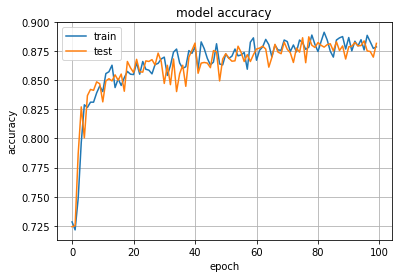

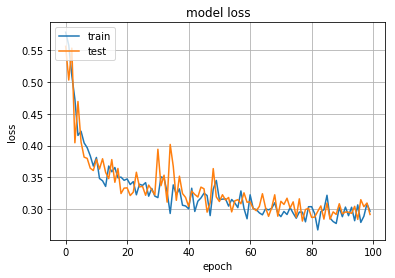

In [0]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.show()